# Base de dados do Census populacional

## Ferramentas globais

In [1]:
!pip install plotly --upgrade

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns # visualização 
import matplotlib.pyplot as plt # visualização
import plotly.express as px # graficos dinamicos

In [3]:
base_census = pd.read_csv('datas/census.csv')

## Data Exploration

In [4]:
base_census.head()

,age,workclass,final-weight,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loos,hour-per-week,native-country,income
0,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K
1,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
2,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
3,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
4,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K


In [5]:
base_census.shape # (linha, coluna)

(32561, 15)

In [6]:
base_census.describe()

,age,final-weight,education-num,capital-gain,capital-loos,hour-per-week
count,32561.000000,3.256100e+04,32561.000000,32561.000000,32561.000000,32561.000000
mean,38.581647,1.897784e+05,10.080679,1077.648844,87.303830,40.437456
std,13.640433,1.055500e+05,2.572720,7385.292085,402.960219,12.347429
min,17.000000,1.228500e+04,1.000000,0.000000,0.000000,1.000000
25%,28.000000,1.178270e+05,9.000000,0.000000,0.000000,40.000000
50%,37.000000,1.783560e+05,10.000000,0.000000,0.000000,40.000000
75%,48.000000,2.370510e+05,12.000000,0.000000,0.000000,45.000000
max,90.000000,1.484705e+06,16.000000,99999.000000,4356.000000,99.000000


In [7]:
base_census.isnull().sum() # verificar se tem valores faltante 

age               0
workclass         0
final-weight      0
education         0
education-num     0
marital-status    0
occupation        0
relationship      0
race              0
sex               0
capital-gain      0
capital-loos      0
hour-per-week     0
native-country    0
income            0
dtype: int64

## Data Visualization

In [8]:
np.unique(base_census['income'], return_counts=True) # checando quantos valores exclusivos temos

(array([' <=50K', ' >50K'], dtype=object), array([24720,  7841]))

#### Comparando as classes e checando a diferença

<Axes: xlabel='income', ylabel='count'>

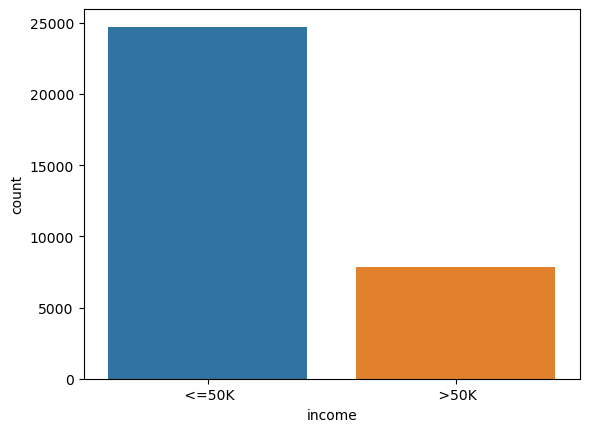

In [9]:
sns.countplot(x = base_census['income'])

#### Análise do Histograma e entender o que compõe o dataframe

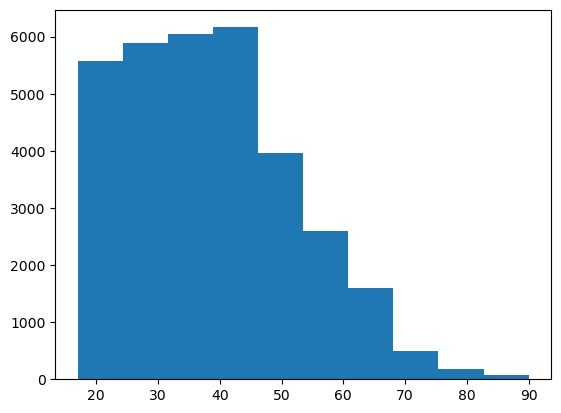

In [10]:
plt.hist(x = base_census['age']);

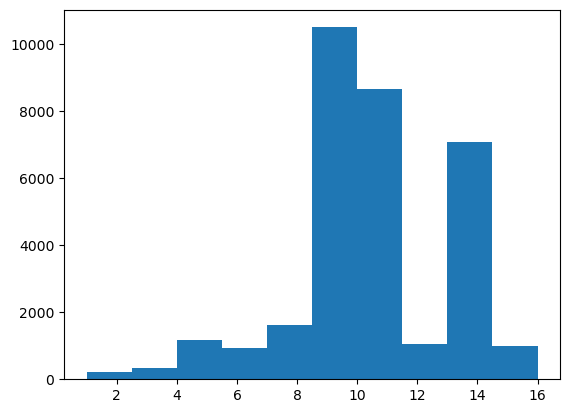

In [11]:
plt.hist(x = base_census['education-num']);

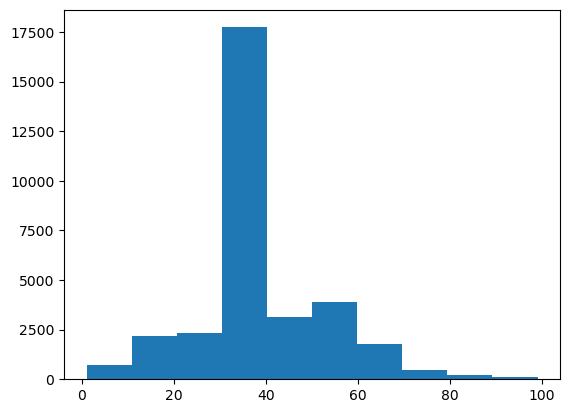

In [12]:
plt.hist(x = base_census['hour-per-week']);

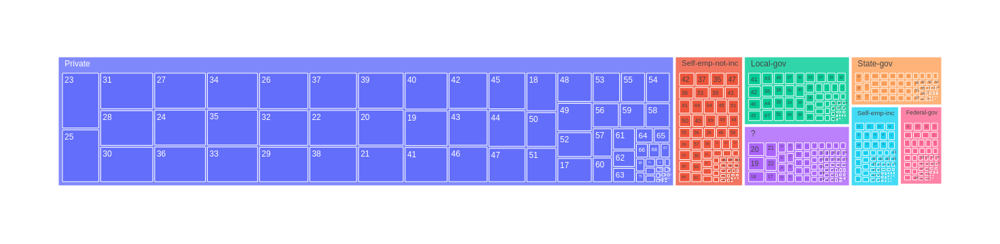

In [13]:
plot = px.treemap(base_census, path=['workclass', 'age'])
plot.show()

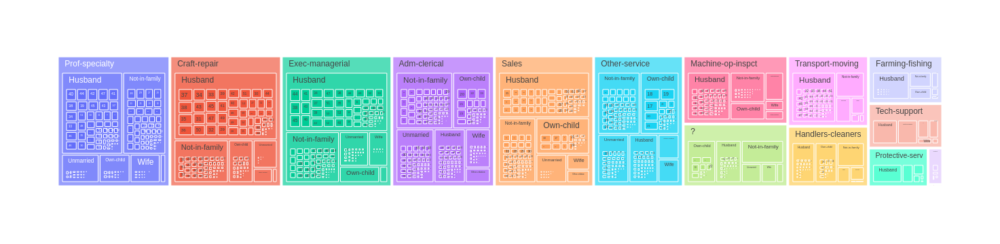

In [14]:
plot = px.treemap(base_census, path=['occupation','relationship','age'])
plot.show()

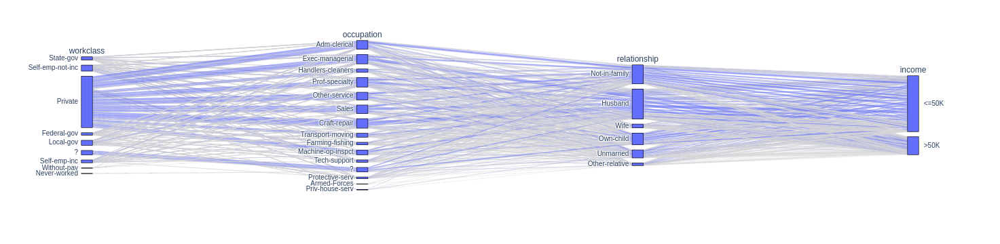

In [15]:
plot = px.parallel_categories(base_census, dimensions=['workclass', 'occupation', 'relationship', 'income'])
plot.show()

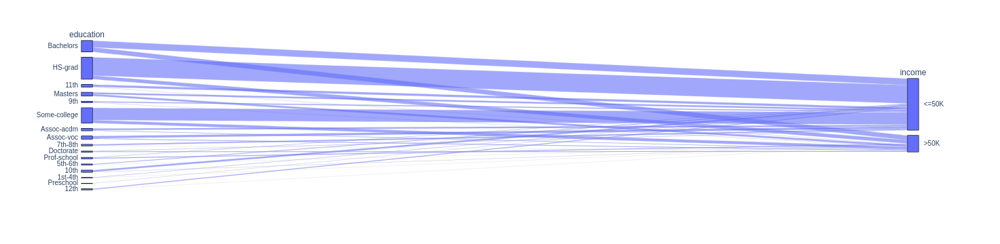

In [16]:
plot = px.parallel_categories(base_census, dimensions=['education', 'income'])
plot.show()

## Divisão entre previsores e classe

In [17]:
"""
    x = previsoras
    y = classe
    
    .values é para fazer a conversão para o numpy
"""

x_census = base_census.iloc[:, 0:14].values
y_census = base_census.iloc[:, 14].values

## Tratamento de atributos categóricos

### LabelEncoder

In [18]:
from sklearn.preprocessing import LabelEncoder

In [19]:
label_encoder_testing = LabelEncoder()

In [33]:
x_census[:, 1] # coluna workclass em formato numpy

array([0., 0., 0., ..., 0., 0., 0.])

In [21]:
teste = label_encoder_testing.fit_transform(x_census[:, 1]) # transformação para trabalhar com machine learning. Pois não é possível trabalhar com strings. Ou seja, vamos ter que transformar em números

In [22]:
teste

array([7, 6, 4, ..., 4, 4, 5])

In [23]:
label_encoder_workclass = LabelEncoder()
label_encoder_education = LabelEncoder()
label_encoder_marital = LabelEncoder()
label_encoder_occupation = LabelEncoder()
label_encoder_relationship = LabelEncoder()
label_encoder_race = LabelEncoder()
label_encoder_sex = LabelEncoder()
label_encoder_country = LabelEncoder()

x_census[:, 1] = label_encoder_workclass.fit_transform(x_census[:, 1])
x_census[:, 3] = label_encoder_education.fit_transform(x_census[:, 3])
x_census[:, 5] = label_encoder_marital.fit_transform(x_census[:, 5])
x_census[:, 6] = label_encoder_occupation.fit_transform(x_census[:, 6])
x_census[:, 7] = label_encoder_relationship.fit_transform(x_census[:, 7])
x_census[:, 8] = label_encoder_race.fit_transform(x_census[:, 8])
x_census[:, 9] = label_encoder_sex .fit_transform(x_census[:, 9])
x_census[:, 13] = label_encoder_country.fit_transform(x_census[:, 13])

In [24]:
x_census

array([[39, 7, 77516, ..., 0, 40, 39],
       [50, 6, 83311, ..., 0, 13, 39],
       [38, 4, 215646, ..., 0, 40, 39],
       ...,
       [58, 4, 151910, ..., 0, 40, 39],
       [22, 4, 201490, ..., 0, 20, 39],
       [52, 5, 287927, ..., 0, 40, 39]], dtype=object)

## OneHotEncoder

In [25]:
len(np.unique(base_census['workclass']))

9

In [26]:
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer

In [28]:
onehotencoder_census = ColumnTransformer(transformers=[('OneHot', OneHotEncoder(), [1, 3, 5, 6, 7, 8, 9, 13])], remainder='passthrough')
onehotencoder_census

ColumnTransformer(remainder='passthrough',
                  transformers=[('OneHot', OneHotEncoder(),
                                 [1, 3, 5, 6, 7, 8, 9, 13])])

In [31]:
x_census = onehotencoder_census.fit_transform(x_census)

In [32]:
x_census

array([[1.0000e+00, 0.0000e+00, 1.0000e+00, ..., 2.1740e+03, 0.0000e+00,
        4.0000e+01],
       [1.0000e+00, 0.0000e+00, 1.0000e+00, ..., 0.0000e+00, 0.0000e+00,
        1.3000e+01],
       [1.0000e+00, 0.0000e+00, 1.0000e+00, ..., 0.0000e+00, 0.0000e+00,
        4.0000e+01],
       ...,
       [1.0000e+00, 0.0000e+00, 1.0000e+00, ..., 0.0000e+00, 0.0000e+00,
        4.0000e+01],
       [1.0000e+00, 0.0000e+00, 1.0000e+00, ..., 0.0000e+00, 0.0000e+00,
        2.0000e+01],
       [1.0000e+00, 0.0000e+00, 1.0000e+00, ..., 1.5024e+04, 0.0000e+00,
        4.0000e+01]])

## Escalonamento dos valores

In [29]:
from sklearn.preprocessing import StandardScaler
scaler_census = StandardScaler()
x_census = scaler_census.fit_transform(x_census)

In [30]:
x_census

array([[-0.2444502 , -0.17429511, -0.26209736, ...,  0.1484529 ,
        -0.21665953, -0.03542945],
       [-0.2444502 , -0.17429511, -0.26209736, ..., -0.14592048,
        -0.21665953, -2.22215312],
       [-0.2444502 , -0.17429511, -0.26209736, ..., -0.14592048,
        -0.21665953, -0.03542945],
       ...,
       [-0.2444502 , -0.17429511, -0.26209736, ..., -0.14592048,
        -0.21665953, -0.03542945],
       [-0.2444502 , -0.17429511, -0.26209736, ..., -0.14592048,
        -0.21665953, -1.65522476],
       [-0.2444502 , -0.17429511, -0.26209736, ...,  1.88842434,
        -0.21665953, -0.03542945]])

In [31]:
## Divisão das bases em treinamento e teste

In [32]:
from sklearn.model_selection import train_test_split

In [33]:
x_census_treinamento, x_census_teste, y_census_treinamento, y_census_teste = train_test_split(x_census, y_census, test_size = 0.15, random_state = 0)

In [34]:
x_census_treinamento.shape, y_census_treinamento.shape

((27676, 108), (27676,))

In [35]:
x_census_teste.shape, y_census_teste.shape

((4885, 108), (4885,))

## Salvar as variáveis

In [37]:
import pickle

In [39]:
with open('census_data.pkl', mode = 'wb') as f:
    pickle.dump([x_census_treinamento, y_census_treinamento, x_census_teste, y_census_teste], f)